# Load Data

In [38]:
import os
from datetime import datetime

import findspark
findspark.init()
from pyspark.sql import SparkSession

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, confusion_matrix, precision_recall_curve, auc

from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Dropout, Bidirectional, BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras.regularizers import l1_l2


In [2]:
# Initialise Spark Session for large-scale data processing
spark = SparkSession.builder.appName("Analysis").getOrCreate()


In [3]:
# Read data using Spark
df_spark = spark.read.csv('F6_Data.csv', header=True, inferSchema=True)

# ! Change" ".csv file name to suit. Data, Updated_Data, F1_Data, F2_Data

In [4]:
# Convert Spark DataFrame to Pandas DataFrame for easier manipulation
data = df_spark.toPandas()


# Enhanced Exploratory Data Analysis (EDA)

In [5]:
# Descriptive Statistics
print("Descriptive Statistics:")
print(data.describe())


Descriptive Statistics:
              Length  Diameter         Degree      Thickness  \
count  108000.000000  108000.0  108000.000000  108000.000000   
mean       24.500000      20.0     179.500000       3.000061   
std        14.430936       0.0     103.923129       1.731975   
min         0.000000      20.0       0.000000       0.000038   
25%        12.000000      20.0      89.750000       1.499993   
50%        24.500000      20.0     179.500000       2.999485   
75%        37.000000      20.0     269.250000       4.499982   
max        49.000000      20.0     359.000000       5.998932   

       Original Thickness  Thickness_Difference  
count            108000.0         108000.000000  
mean                  6.0              2.999939  
std                   0.0              1.731975  
min                   6.0              0.001068  
25%                   6.0              1.500018  
50%                   6.0              3.000515  
75%                   6.0              4.500007  

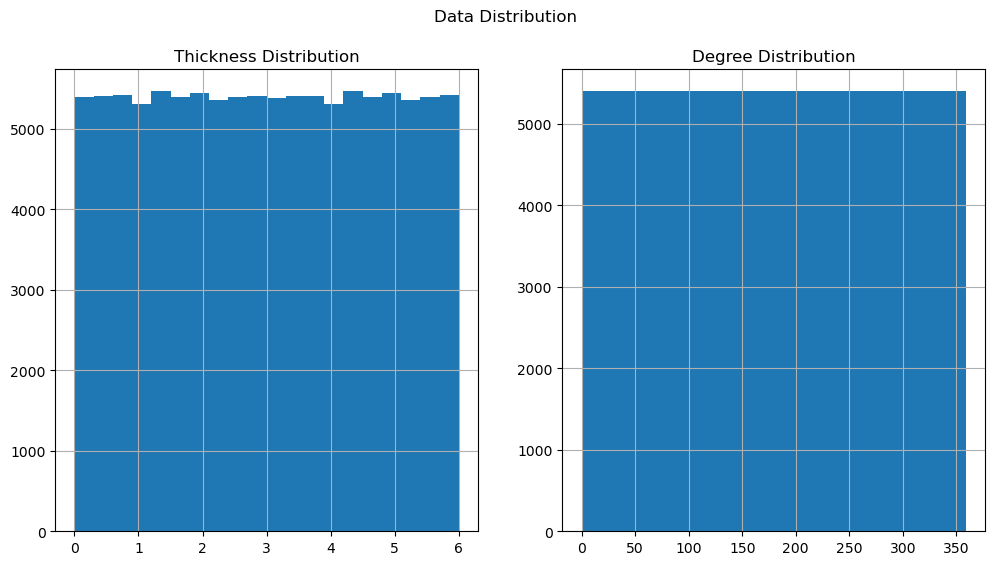

In [6]:
# Data Distribution Analysis
# Histograms to analyze the distribution of key features 'Thickness' and 'Degree'
# Creating Histograms
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
data['Thickness'].hist(bins=20)
plt.title('Thickness Distribution')

plt.subplot(1, 2, 2)
data['Degree'].hist(bins=20)
plt.title('Degree Distribution')

plt.suptitle("Data Distribution")
# Saving Histogram
plt.savefig("F6_Data_Distribution.png")
plt.show()


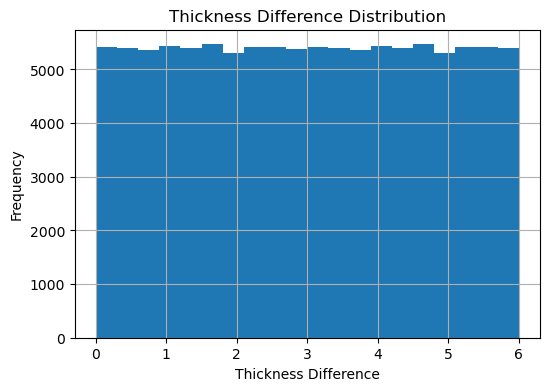

In [7]:
# Histogram for 'Thickness_Difference'
plt.figure(figsize=(6, 4))
data['Thickness_Difference'].hist(bins=20)
plt.title('Thickness Difference Distribution')
plt.xlabel('Thickness Difference')
plt.ylabel('Frequency')
plt.savefig("F6_Data_Thickness_Difference_Distribution.png")
plt.show()


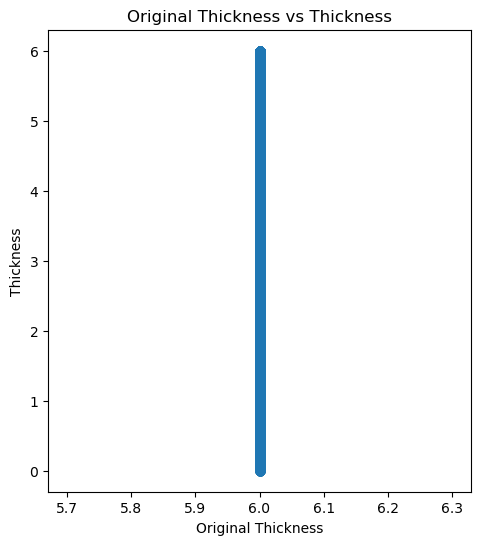

In [8]:
# Plots for Original Thickness vs. Thickness
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data['Original Thickness'], data['Thickness'])
plt.title('Original Thickness vs Thickness')
plt.xlabel('Original Thickness')
plt.ylabel('Thickness')

# Save the plot
plt.savefig("F6_Data_Original_Thickness_vs_Thickness.png")
plt.show()


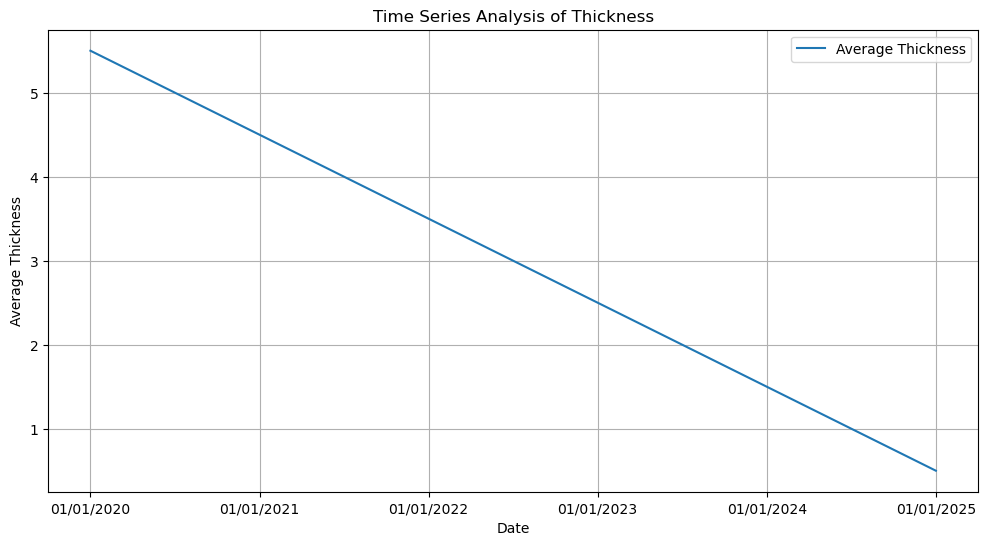

In [9]:
# Time Series Analysis
# Group by 'Date' and calculate the mean only for numeric columns
time_series_data = data.groupby('Date').mean(numeric_only=True)

# Plotting
plt.figure(figsize=(12,6))
plt.plot(time_series_data['Thickness'], label='Average Thickness')
plt.title('Time Series Analysis of Thickness')
plt.xlabel('Date')
plt.ylabel('Average Thickness')
plt.legend()
plt.grid(True)

# Save the plot
plt.savefig("F6_Data_Time_Series_Analysis_of_Thickness.png")
plt.show()


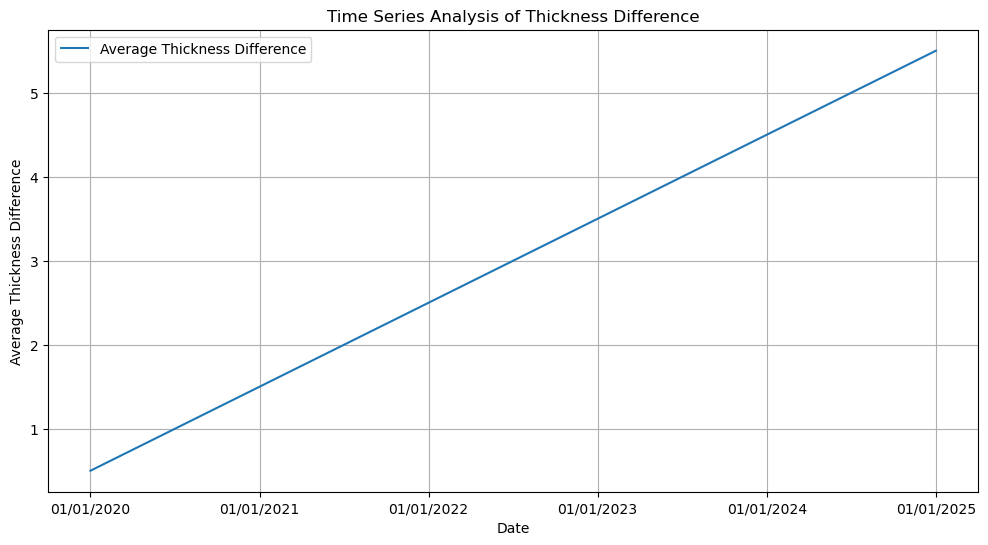

In [10]:
# Plotting Thickness Difference over Time
plt.figure(figsize=(12,6))
plt.plot(time_series_data['Thickness_Difference'], label='Average Thickness Difference')
plt.title('Time Series Analysis of Thickness Difference')
plt.xlabel('Date')
plt.ylabel('Average Thickness Difference')
plt.legend()
plt.grid(True)
plt.savefig("F6_Data_Time_Series_Analysis_of_Thickness_Difference.png")
plt.show()


# Visualization

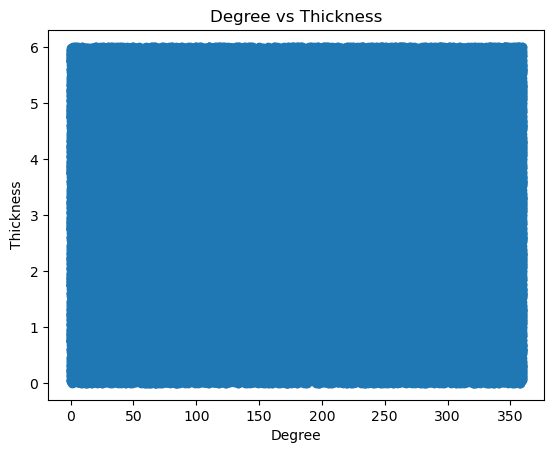

In [11]:
# Scatter Plots
plt.scatter(data['Degree'], data['Thickness'])
plt.title('Degree vs Thickness')
plt.xlabel('Degree')
plt.ylabel('Thickness')
plt.savefig("F6_Data_Degree_vs_Thickness.png")
plt.show()


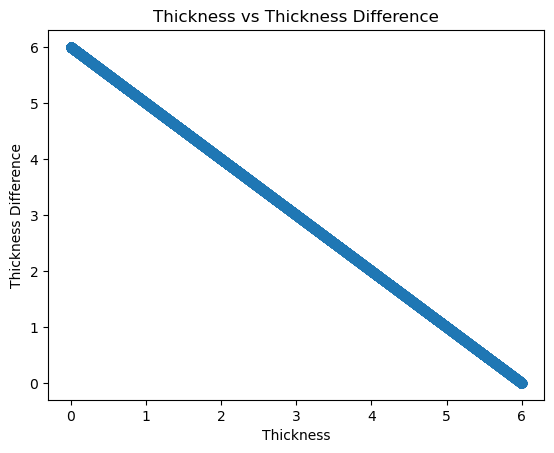

In [12]:
# Scatter Plot for 'Thickness_Difference' vs 'Thickness'
plt.scatter(data['Thickness'], data['Thickness_Difference'])
plt.title('Thickness vs Thickness Difference')
plt.xlabel('Thickness')
plt.ylabel('Thickness Difference')
plt.savefig("F6_Data_Thickness_vs_Thickness_Difference.png")
plt.show()


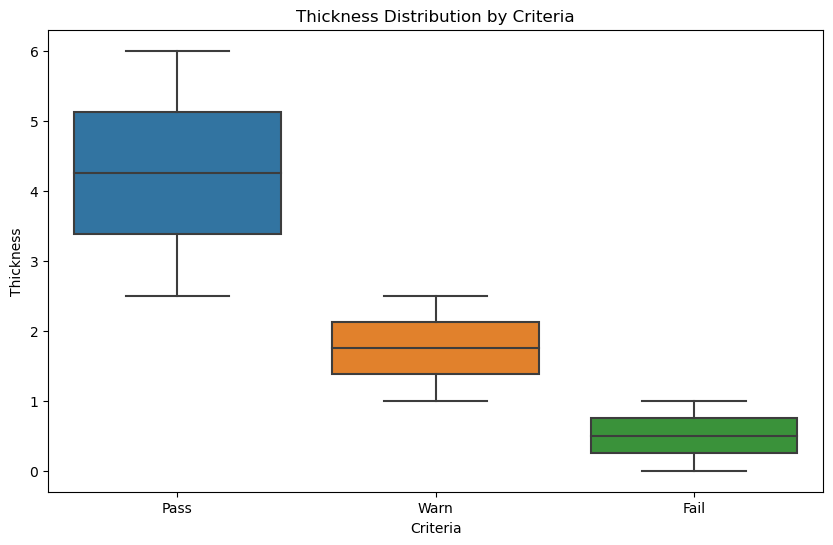

In [13]:
# Boxplots
plt.figure(figsize=(10, 6))
sns.boxplot(x='Criteria', y='Thickness', data=data)
plt.title('Thickness Distribution by Criteria')
plt.savefig("F6_Data_Thickness_Distribution_by_Criteria.png")
plt.show()


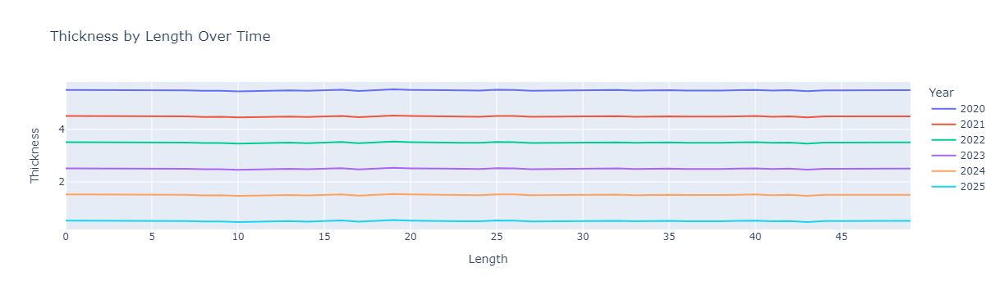

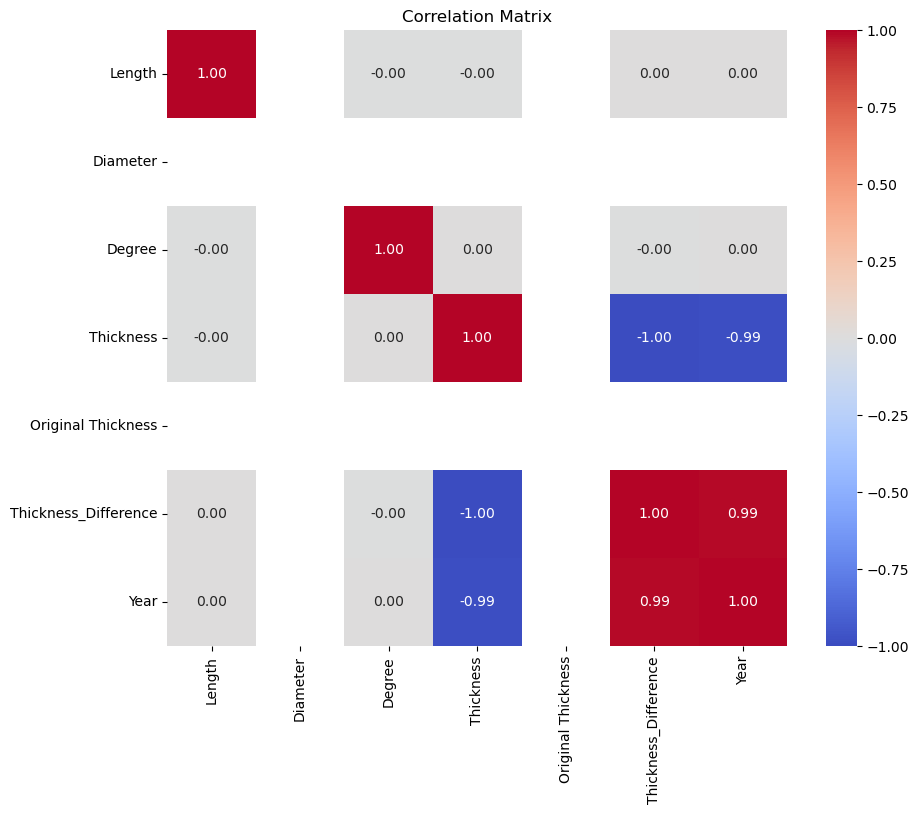

In [14]:
# Convert 'Date' to datetime and extract 'Year'
data['Date'] = pd.to_datetime(data['Date'])
data['Year'] = data['Date'].dt.year

# Grouping data for visualization, specifying numeric_only=True
grouped_data = data.groupby(['Length', 'Year']).mean(numeric_only=True).reset_index()

# Plot using Plotly
fig = px.line(grouped_data, x='Length', y='Thickness', color='Year', title='Thickness by Length Over Time')

# Save Plotly figures after installing kaleido
fig.write_image("F6_Data_Avg_Thickness_by_Length_Over_Time.png")
fig.show()

# Correlation Analysis using Seaborn
corr_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


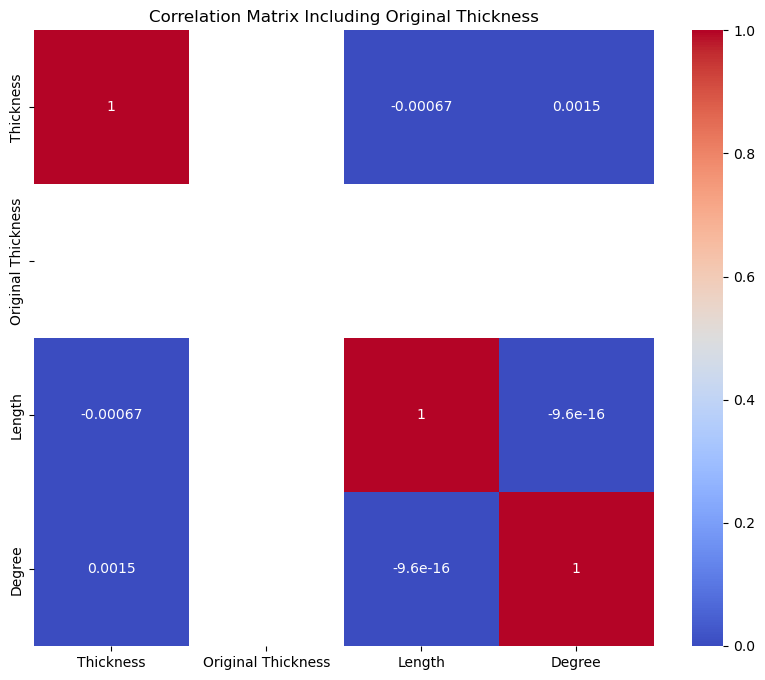

In [15]:
# Correlation Analysis with Original Thickness
corr_matrix = data[['Thickness', 'Original Thickness', 'Length', 'Degree']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix Including Original Thickness")

# Save the plot
plt.savefig("F6_Data_Correlation_Matrix_Including_Original_Thickness.png")
plt.show()


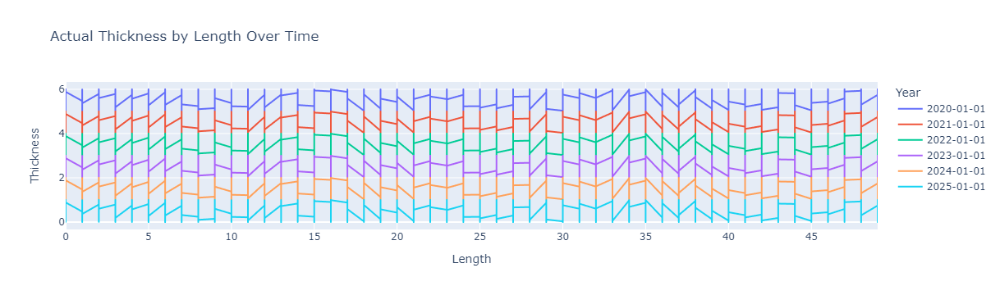

In [16]:
# Convert 'Date' to datetime object for easier handling
data['Date'] = pd.to_datetime(data['Date'])

# Convert 'Date' to a string for Plotly
data['Date'] = data['Date'].dt.strftime('%Y-%m-%d')

# Create the interactive plot
fig = px.line(data, x='Length', y='Thickness', color='Date', 
              title='Actual Thickness by Length Over Time', 
              labels={'Thickness': 'Thickness', 'Length': 'Length', 'Date': 'Year'})

fig.update_layout(legend_title_text='Year')
fig.update_xaxes(title_text='Length')
fig.update_yaxes(title_text='Thickness')

# Save Plotly figures
fig.write_image("F6_Data_Actual_Thickness_by_Length_Over_Time.png")

fig.show()


In [17]:
# Ensure 'Date' is in datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Extract the year from the 'Date' column
data['Year'] = data['Date'].dt.year

# Group by 'Year' and 'Criteria', count occurrences, and fill missing values with 0
criteria_count_per_year = data.groupby(['Year', 'Criteria']).size().unstack(fill_value=0)

# Print the resulting DataFrame
print(criteria_count_per_year)


Criteria   Fail   Pass   Warn
Year                         
2020          0  18000      0
2021          0  18000      0
2022          0  18000      0
2023          0   8999   9001
2024          0      0  18000
2025      18000      0      0


# Data Aggregation and Grouping

In [18]:
# Data Aggregation for LSTM
# Ensure data is sorted by Date
data.sort_values(by='Date', inplace=True)
# Group data as needed for LSTM input
# ... [Include any grouping/aggregation necessary for your LSTM model]

In [19]:
# Modify the aggregation to include 'Thickness_Difference'
aggregated_data = data.groupby(['Year', 'Criteria']).agg({'Thickness': ['mean', 'std'], 
                                                          'Thickness_Difference': ['mean', 'std'], 
                                                          'Length': 'count'})
print(aggregated_data)


              Thickness           Thickness_Difference           Length
                   mean       std                 mean       std  count
Year Criteria                                                          
2020 Pass      5.500061  0.288177             0.499939  0.288177  18000
2021 Pass      4.500061  0.288177             1.499939  0.288177  18000
2022 Pass      3.500061  0.288177             2.499939  0.288177  18000
2023 Pass      2.749379  0.144543             3.250621  0.144543   8999
     Warn      2.250798  0.144579             3.749202  0.144579   9001
2024 Warn      1.500061  0.288177             4.499939  0.288177  18000
2025 Fail      0.500061  0.288177             5.499939  0.288177  18000


# Statistical Analysis

In [20]:
# Skewness and Kurtosis for Thickness
print("Skewness of Thickness:", data['Thickness'].skew())
print("Kurtosis of Thickness:", data['Thickness'].kurt())


Skewness of Thickness: -7.744506897793004e-06
Kurtosis of Thickness: -1.2002220153260383


In [21]:
# Skewness and Kurtosis for Thickness_Difference
print("Skewness of Thickness Difference:", data['Thickness_Difference'].skew())
print("Kurtosis of Thickness Difference:", data['Thickness_Difference'].kurt())


Skewness of Thickness Difference: 7.744506897793004e-06
Kurtosis of Thickness Difference: -1.2002220153260383


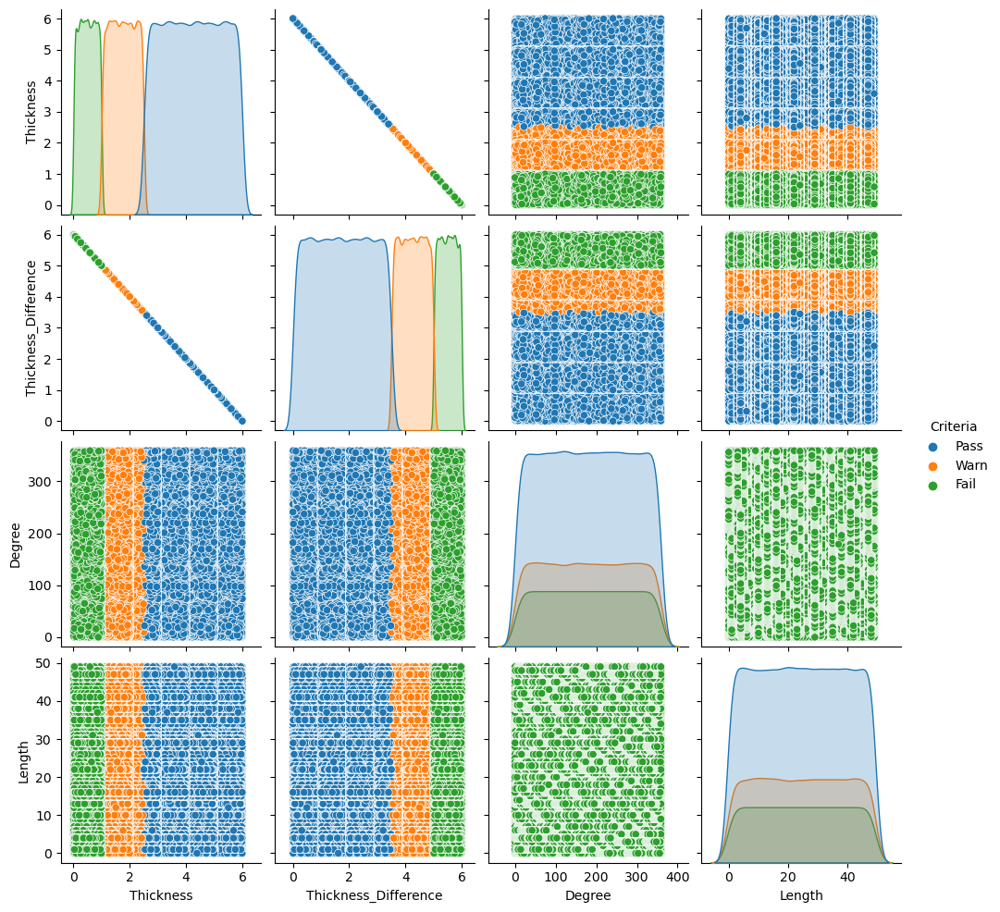

In [22]:
# Relationships between features
sns.pairplot(data[['Thickness', 'Thickness_Difference', 'Degree', 'Length', 'Criteria']], hue='Criteria')
plt.savefig("F6_Data_Advanced_Pairplot.png")
plt.show()


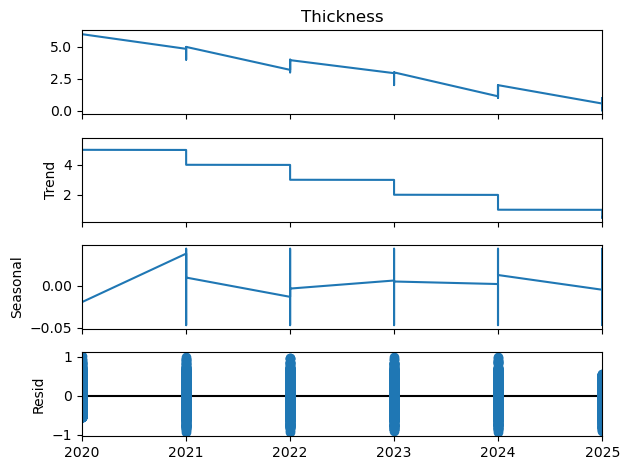

In [23]:
# Time-Series Decomposition
ts_data = data.set_index('Date')
decomposition = seasonal_decompose(ts_data['Thickness'], model='additive', period=365)

fig = decomposition.plot()
plt.savefig("F6_Data_Time_Series_Decomposition.png")
plt.show()


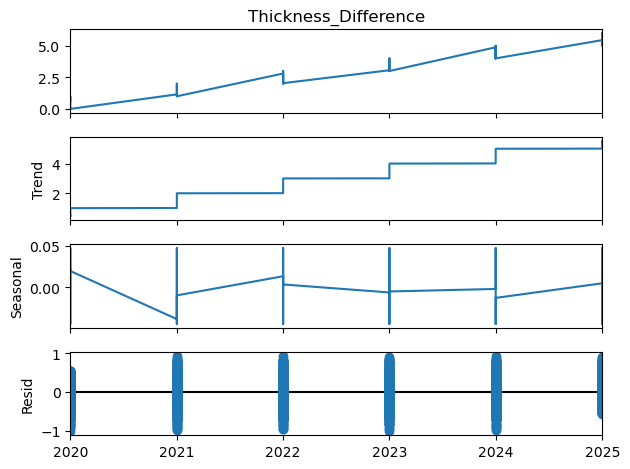

In [24]:
# Time-Series Decomposition for 'Thickness_Difference
decomposition_diff = seasonal_decompose(ts_data['Thickness_Difference'], model='additive', period=365)
fig_diff = decomposition_diff.plot()
plt.savefig("F6_Data_Time_Series_Decomposition_Thickness_Difference.png")
plt.show()


In [25]:
# Regression Analysis
X = data[['Degree', 'Length', 'Thickness_Difference']]  # predictor variables
y = data['Thickness']  # response variable
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:              Thickness   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.909e+33
Date:                Tue, 09 Jan 2024   Prob (F-statistic):               0.00
Time:                        14:00:16   Log-Likelihood:             3.4285e+06
No. Observations:              108000   AIC:                        -6.857e+06
Df Residuals:                  107996   BIC:                        -6.857e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    6.0000 

# LSTM Model Data Preparation

In [26]:
# Time-Series Data Reshaping
# Reshape data for LSTM input
# Assuming you've decided the number of time steps and features
time_steps = 10  # example value
n_features = data.shape[1]  # number of features
data_reshaped = data.values.reshape((data.shape[0] // time_steps, time_steps, n_features))


In [27]:
# Data Transformation for LSTM
scaler = MinMaxScaler()
data[['Thickness', 'Original Thickness', 'Length', 'Degree', 'Thickness_Difference']] = scaler.fit_transform(data[['Thickness', 'Original Thickness', 'Length', 'Degree', 'Thickness_Difference']])


# Additional Statistical Analysis for Model Preparation

In [28]:
# Check for Multicollinearity
# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print(vif_data)


                feature       VIF
0                 const  9.871184
1                Degree  1.000002
2                Length  1.000000
3  Thickness_Difference  1.000003


In [29]:
# Stationarity Check for Enhanced Time-Series Modeling
# adf
def perform_adf_test(series):
    try:
        adf_result = adfuller(series)
        print(f"ADF Statistic: {adf_result[0]}")
        print(f"p-value: {adf_result[1]}")
        for key, value in adf_result[4].items():
            print(f"Critical Value ({key}): {value}")
    except Exception as e:
        print(f"Error performing ADF test: {e}")

perform_adf_test(data['Thickness'])

# Perform Augmented Dickey-Fuller test
print("ADF Test for Thickness:")
adf_test_thickness = adfuller(data['Thickness'])
print("p-value:", adf_test_thickness[1])

print("\nADF Test for Thickness Difference:")
adf_test_thickness_diff = adfuller(data['Thickness_Difference'])
print("p-value:", adf_test_thickness_diff[1])


ADF Statistic: -0.9378837850240741
p-value: 0.7752409545552573
Critical Value (1%): -3.4304105897853563
Critical Value (5%): -2.861566779757552
Critical Value (10%): -2.5667842539240815
ADF Test for Thickness:
p-value: 0.7752409545552573

ADF Test for Thickness Difference:
p-value: 0.7752409545551048


In [30]:
# Stationarity Check for Enhanced Time-Series Modeling
# kpss

def perform_kpss_test(series):
    try:
        kpss_result = kpss(series)
        print(f"KPSS Statistic: {kpss_result[0]}")
        print(f"p-value: {kpss_result[1]}")
        for key, value in kpss_result[3].items():
            print(f"Critical Value ({key}): {value}")
    except Exception as e:
        print(f"Error performing KPSS test: {e}")

# Example usage with 'Thickness' data
perform_kpss_test(data['Thickness'])

# KPSS Test
print("KPSS Test for Thickness:")
kpss_test_thickness = kpss(data['Thickness'])
print("p-value:", kpss_test_thickness[1])

print("\nKPSS Test for Thickness Difference:")
kpss_test_thickness_diff = kpss(data['Thickness_Difference'])
print("p-value:", kpss_test_thickness_diff[1])


KPSS Statistic: 54.453097069424054
p-value: 0.01
Critical Value (10%): 0.347
Critical Value (5%): 0.463
Critical Value (2.5%): 0.574
Critical Value (1%): 0.739
KPSS Test for Thickness:
p-value: 0.01

KPSS Test for Thickness Difference:
p-value: 0.01


C:\Users\unsto\AppData\Local\Temp\ipykernel_10816\1032140654.py:6: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\unsto\AppData\Local\Temp\ipykernel_10816\1032140654.py:19: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\unsto\AppData\Local\Temp\ipykernel_10816\1032140654.py:23: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




# Saving Enhanced Data for Future Use

In [31]:
# Save Enhanced Data for Model Training
data.to_csv('F6_Transformed_Data.csv', index=False)


In [49]:
# 5% Sample of created data DataFrame
# Read the full dataset from the 'F6_Transformed_Data.csv' file
full_transformed_data = pd.read_csv('F6_Transformed_Data.csv')


In [50]:
# Display the DataFrame to confirm
print(full_transformed_data)

          Length        Date  Diameter    Degree  Thickness Criteria  \
0       0.000000  2020-01-01        20  0.000000   0.898136     Pass   
1       0.673469  2020-01-01        20  0.309192   0.865953     Pass   
2       0.673469  2020-01-01        20  0.311978   0.903751     Pass   
3       0.673469  2020-01-01        20  0.314763   0.899059     Pass   
4       0.673469  2020-01-01        20  0.317549   0.871463     Pass   
...          ...         ...       ...       ...        ...      ...   
107995  0.326531  2025-01-01        20  0.657382   0.023995     Fail   
107996  0.326531  2025-01-01        20  0.654596   0.149355     Fail   
107997  0.326531  2025-01-01        20  0.651811   0.094208     Fail   
107998  0.326531  2025-01-01        20  0.668524   0.043400     Fail   
107999  1.000000  2025-01-01        20  1.000000   0.097314     Fail   

        Original Thickness  Thickness_Difference  Year  
0                      0.0              0.101864  2020  
1                    

In [51]:
# Sample 5% of the data
sampled_transformed_data = full_transformed_data.sample(frac=0.05, random_state=1)  # 5% sample, random_state for reproducibility


In [52]:
# Display the DataFrame to confirm
print(sampled_transformed_data)


         Length        Date  Diameter    Degree  Thickness Criteria  \
6503   0.979592  2020-01-01        20  0.144847   0.956922     Pass   
93170  0.530612  2025-01-01        20  0.493036   0.160108     Fail   
41918  1.000000  2022-01-01        20  0.752089   0.518218     Pass   
38836  0.510204  2022-01-01        20  0.559889   0.646318     Pass   
53017  0.346939  2022-01-01        20  0.289694   0.525775     Pass   
...         ...         ...       ...       ...        ...      ...   
31489  0.081633  2021-01-01        20  0.175487   0.757922     Pass   
21014  0.510204  2021-01-01        20  0.061281   0.826208     Pass   
1694   0.693878  2020-01-01        20  0.888579   0.851362     Pass   
37632  0.755102  2022-01-01        20  0.061281   0.620358     Pass   
89141  0.346939  2024-01-01        20  0.473538   0.203692     Warn   

       Original Thickness  Thickness_Difference  Year  
6503                  0.0              0.043078  2020  
93170                 0.0          

In [53]:
# Save the sampled data to new CSV file 'Sampled_F6_Transformed_Data.csv'
sampled_transformed_data.to_csv('Sampled_F6_Transformed_Data.csv', index=False)


In [54]:
# Stop the Spark Session
spark.stop()
